<center>
<p><img src="https://mcd.unison.mx/wp-content/themes/awaken/img/logo_mcd.png" width="150">
</p>

<h1> Matemáticas para ciencia de datos</h1>


<h3>Ejercicio obligatorio</h3>

<h4> Alumna: Diana Laura Ballesteros Valenzuela</h4>

<img src="https://identidadbuho.unison.mx/wp-content/uploads/2019/06/letragrama-cmyk-72.jpg" width="150">

</center>

En el año 2020 el CONAPO (Consejo Nacional de Población) publicó los índices de marginación urbana por AGEBS urbanas –Áreas Geoestadísticas Básicas urbanas– basado en el Censo de Población y Vivienda 2020. Estos índices son de suma importancia para diferentes estudios que tratan de medir el papel que juega la pobreza en diferentes sectores de la vida pública:

https://www.gob.mx/conapo/documentos/indices-de-marginacion-2020-284372.

En este censo se recopila información y se establecen algunas fórmulas muy sencillas (no así la recopilación de la información que se hace cada 10 años) para estimar las siguientes 11 variables de marginación:

- P6A14NAE: Porcentaje de población de 6 a 14 que no asiste a la escuela

- SBASC: Porcentaje de población de 15 años o más sin educación básica

- PSDSS: Porcentaje de población sin derechohabiencia a los servicios de salud

- OVSDE: Porcentaje de ocupantes en viviendas sin drenaje ni excusado

- OVSEE: Porcentaje de ocupantes en viviendas sin energía eléctrica

- OVSAE: Porcentaje de ocupantes en viviendas sin agua entubada

- OVPT: Porcentaje de ocupantes en viviendas con piso de tierra

- OVHAC: Porcentaje de ocupantes en viviendas con hacinamiento

- OVSREF: Porcentaje de ocupantes en viviendas sin refrigerador

- OVSINT: Porcentaje de ocupantes en viviendas sin internet

- OSCEL: Porcentaje de ocupantes en viviendas sin celular

A partir de ahí se establece un índice llamado ÍNDICE DE MARGINACIÓN URBANA IM_2020 por medio de un procedimiento que se puede consultar en la siguiente nota metodológica:

https://www.gob.mx/cms/uploads/attachment/file/685307/Nota_t_cnica_IMU_2020.pdf

A partir de una estatificación del IM_2020 se calcula el GRADO DE MARGINACIÓN URBANA GM_2020 que puede ser:

- Muy Alto

- Alto

- Medio

- Bajo

- Muy bajo

**La polémica**

En el 2010, se calculó el INDICE DE MARGINACIÓN URBANA utilizando un procedimiento estándar de componentes principales, pero en el 2020 se decidió cambiar el cálculo por el que presenta la nota metodológica, llamado DP2, el cual fue severamente criticado por su falta de claridad y –según algunos expertos– «tenía muchos huecos». Aquí un ejemplo: https://www.facebook.com/events/402771884844304/. Por otro lado, los autores de la nota, afirman lo siguiente:

«El método DP2 ofrece múltiples ventajas [...] Estas bondades del método DP2 brindan mayores beneficios que el Análisis de Componentes Principales»

**Objetivo del proyecto**

Utilizar todas las herramientas de álgebra lineal vista en clase para tener una opinión científica, basada en argumentos matemáticos, sobre la polémica. En particular:

Conocer y analizar los datos con los que se hace el cálculo del IM_2020 a partir de los conceptos que vimos en clase.
Utilizar con las 11 variables de marginación el procedimiento de componentes principales y comparar con el índice propuesto con la CONAPO.
Entender matemáticamente las funciones de la librería de PCA de sklearn, lo que en particular te ayudará a entender teóricamente este procedimiento.
NO es objetivo del proyecto estudiar la metodología DP2, únicamente a partir del IM_2020 hacer un análisis. ¡Se sorprenderán de lo que seguro van a encontrar!

**Instrucciones**

A lo largo de la libreta se establecerán varias preguntas, algunas de ellas no tienen respuesta única. Algunas instrucciones sí son muy específicas para las cuales se debe de dar la respuesta puntual y precisa. Haz una libreta propia al final expórtala sin código al menos que lo consideres relevante.

Importamos librerias necesarias 

In [1]:
import xlrd
import numpy as np
import pandas as pd
import plotly.express as px
from IPython import display
import matplotlib.pyplot as plt
from sklearn import linear_model
from numpy.linalg import matrix_rank
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression

## **1. Descarga y exploración inicial**

- Descarga el archivo adjunto MARGINACION_AGEBS_2020.xls y crea un dataframe de nombre df_INDICE

In [2]:
df_INDICE = pd.read_excel("MARGINACION_AGEBS_2020.xls")

In [3]:
df_INDICE

,CVE_AGEB,ENT,NOM_ENT,MUN,NOM_MUN,LOC,NOM_LOC,AGEB,POB_TOT,P6A14NAE,...,OVSEE,OVSAE,OVPT,OVHAC,OVSREF,OVSINT,OSCEL,IM_2020,GM_2020,IMN_2020
0,0100100010017,1,Aguascalientes,1,Aguascalientes,1,Aguascalientes,0017,2237,13.076923,...,0.357942,0.000000,0.089485,32.035794,19.239374,71.543624,3.445190,119.325886,Medio,0.932129
1,010010001006A,1,Aguascalientes,1,Aguascalientes,1,Aguascalientes,006A,1411,0.800000,...,0.000000,0.000000,0.000000,2.055280,0.000000,2.763997,0.566974,125.820757,Muy bajo,0.982865
2,0100100010106,1,Aguascalientes,1,Aguascalientes,1,Aguascalientes,0106,2962,3.157895,...,0.000000,0.000000,0.135318,5.538669,0.371496,17.223911,0.810537,125.749891,Muy bajo,0.982311
3,0100100010163,1,Aguascalientes,1,Aguascalientes,1,Aguascalientes,0163,2698,2.788845,...,0.000000,0.000000,0.148478,12.008895,1.890289,34.395849,1.000741,125.074122,Muy bajo,0.977032
4,0100100010182,1,Aguascalientes,1,Aguascalientes,1,Aguascalientes,0182,2218,1.759531,...,0.000000,0.000000,0.452489,0.588235,0.226860,1.719457,0.271493,126.020458,Muy bajo,0.984425
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50785,3205700010408,32,Zacatecas,57,Trancoso,1,Trancoso,0408,203,12.244898,...,0.000000,0.985222,6.403941,45.320197,25.615764,98.029557,5.418719,113.892631,Muy alto,0.889687
50786,3205800010015,32,Zacatecas,58,Santa María de la Paz,1,Santa María de la Paz,0015,707,5.737705,...,0.285714,0.000000,1.285714,27.000000,6.857143,55.714286,10.571429,119.817647,Medio,0.935971
50787,320580001002A,32,Zacatecas,58,Santa María de la Paz,1,Santa María de la Paz,002A,845,6.481481,...,0.000000,0.476190,0.595238,15.476190,10.238095,57.976190,12.380952,120.284585,Medio,0.939618
50788,3205800010104,32,Zacatecas,58,Santa María de la Paz,1,Santa María de la Paz,0104,169,2.631579,...,0.000000,0.000000,0.000000,42.073171,10.365854,77.439024,1.829268,121.915816,Bajo,0.952361


- A partir de df_INDICE crea el data frame df_FEATURES con las 11 variables de marginación:

In [4]:
df_FEATURES = df_INDICE[['P6A14NAE', 'SBASC', 'PSDSS', 'OVSDE', 'OVSEE', 'OVSAE', 'OVPT', 'OVHAC', 'OVSREF', 'OVSINT', 'OSCEL']]

Veamos la distribucion que hay por porcentaje de ocupantes en viviendas sin drenaje ni excusado por entidad 

In [5]:
fig = px.scatter(df_INDICE, x="NOM_ENT", y="OVSDE", color_discrete_sequence=['blue'], title = 'Porcentaje de ocupantes en viviendas sin drenaje ni excusado')
fig.show()

- Construye 3 matrices con 3 columnas de df_INDICE de rango 1, 2 y 3, de dimensiones $50790×3$. Grafica esas tres matrices de datos en 3D. Localiza en la gráfica al Ran $A^{T}$.

In [6]:
df_INDICE_3= df_FEATURES[['OVPT', 'OVSAE', 'OVSDE']]

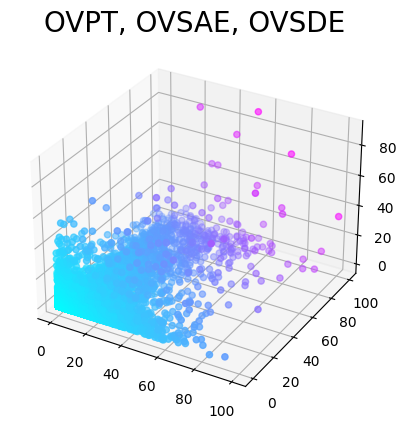

In [7]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(df_INDICE_3['OVPT'], 
               df_INDICE_3['OVSAE'], 
                   df_INDICE_3['OVSDE'],
                       c=(df_INDICE_3['OVPT']+ 
                            df_INDICE_3['OVSAE']+ 
                                  df_INDICE_3['OVSDE']),
                                       cmap = plt.get_cmap('cool'))
ax.set_title('OVPT, OVSAE, OVSDE', fontsize=20)
plt.show()

In [8]:
matrix_rank(df_INDICE_3)

3

Vemos que el rango es todo el subespacio que graficamos

## **2. Ajuste simple por mínimos cuadrados**

- Decide si las columnas POB_TOT y IM_2020 (población total) de df_INDICE definen una función o no. Justifica tu respuesta.

In [9]:
fig = px.scatter(x=df_INDICE["POB_TOT"], y=df_INDICE["IM_2020"], title = 'Gráfica 4: Población total por AGEB en función del Índice de Marginación: 2020')
fig.show()

In [10]:
df_INDICE["POB_TOT"].value_counts()

92       63
99       60
116      59
96       57
106      56
         ..
14216     1
10396     1
16986     1
10451     1
5235      1
Name: POB_TOT, Length: 6961, dtype: int64

In [11]:
df_INDICE["IM_2020"].value_counts()

119.325886    1
108.922210    1
110.257804    1
110.984252    1
111.377510    1
             ..
119.000673    1
124.253112    1
122.635242    1
122.038277    1
122.177483    1
Name: IM_2020, Length: 50790, dtype: int64

Vemos que tenemos diferentes valores de POB TOTAL, pero la mayoria son repetidos en la misma columna, y vemos que hay valores unicos en la columa de IM_2020.
Por lo que a varios valores de X le tocan diferentes valores de Y. Por lo que por la definición de funcion, no se aplica para estos datos. 

- Agrupa todas las AGEBS por población total y asigna la media del índice de marginación de cada grupo AGEB. Decide si la relación POB_TOT → IM_2020.mean es una función.

In [12]:
df_IM2020_POBTOT = df_INDICE[['POB_TOT', 'IM_2020']] #creamos nuevo dataframe

In [13]:
df_IM_mean = pd.DataFrame(df_IM2020_POBTOT.groupby('POB_TOT')["IM_2020"].mean().reset_index(name ='Mean'))
df_IM_mean

,POB_TOT,Mean
0,22,123.899211
1,39,125.082429
2,40,104.191771
3,43,127.654501
4,47,122.254582
...,...,...
6956,23683,123.328987
6957,24531,119.083415
6958,25213,122.205617
6959,28908,123.942147


In [14]:
df_IM_mean["POB_TOT"].value_counts()

22       1
4726     1
4738     1
4737     1
4736     1
        ..
2360     1
2359     1
2358     1
2357     1
29065    1
Name: POB_TOT, Length: 6961, dtype: int64

In [15]:
df_IM_mean["Mean"].value_counts()

123.899211    1
120.273197    1
119.703092    1
122.614476    1
121.075861    1
             ..
121.465965    1
119.418588    1
119.566634    1
122.919992    1
124.338342    1
Name: Mean, Length: 6961, dtype: int64

Vemos que tenemos valores unicos de X y de Y, por lo que estos datos si cumplen con la definición de funcion. 

- 2.3 Resuelve el problema de encontrar $\alpha$ y $\beta$ que mejor ajuste a la recta IM_2020.mean = $\alpha$ POB_TOT + $\beta$ utilizando el concepto de pseudo-inversa. 

In [16]:
fig = px.scatter(x=df_IM_mean["POB_TOT"], y=df_IM_mean["Mean"], trendline="ols",trendline_color_override="green")
fig.show()

## **3. Relación lineal entre el índice de marginación urbana y los indicadores**

- Encuentra las relaciones lineales de IM_2020 con las columnas de df_FEATURES. Reporta cuidadosamente tus conclusiones. Establece las relaciones encontradas en fórmulas matemáticas específicas. Hint : Proyecta a IM_2020 sobre las columnas de df_FEATURES estadarizada.

In [18]:
IM_2020 = df_INDICE["IM_2020"].values
df_FEATURES = np.array(df_FEATURES) 

regresion(df_FEATURES,IM_2020) #aplicamos regresion

Coeficientes: [-0.18093874 -0.06602918 -0.07426677 -0.2829936  -0.33139186 -0.076051
 -0.0989917  -0.0302336  -0.0543476  -0.01280568 -0.07258523]

Interceptor: 128.01433686443082


Vemos como todas las variables son negativas, esto quiere decir que cuanto mas altas son las carencias, menor es el indice, lo que nos lleva a un nivel alto de marginación.

## **4. Análisis de componentes principales**

Aplica el procedimiento de componentes principales a la matriz df_FEATURES usando la paquetería PCA de sklearn.decomposition y define un índice alternativo IM_2020_ALT definido como la primera componente. En términos lineales ¿qué tan distintos son IM_2020 y IM_2020_ALT? En la figura de abajo te muestro una gráfica de lo que me salió a mí graficando por entidad federativa, puedes explorar otras opciones para visualizar tu resultado.

<img src="grafica.png">

In [43]:
df_IM2020_ALT = df_INDICE[['NOM_ENT','IM_2020']]
df_IM2020_ALT.insert(loc=2, column='IM_2020_ALT', value= IM_2020_ALT[0] )
df_IM2020_ALT = df_IM2020_ALT.groupby(['NOM_ENT'], as_index = False).mean()

,NOM_ENT,IM_2020,IM_2020_ALT
0,Aguascalientes,122.744526,-1.224152
1,Baja California,121.109760,-0.748306
2,Baja California Sur,121.819653,-0.750074
3,Campeche,119.898810,0.367014
4,Chiapas,115.234129,2.331726
5,Chihuahua,121.870519,-0.779999
6,Ciudad de México,122.225778,-1.251578
7,Coahuila de Zaragoza,122.130486,-0.917751
8,Colima,121.941324,-0.809733
9,Durango,120.962324,-0.342749


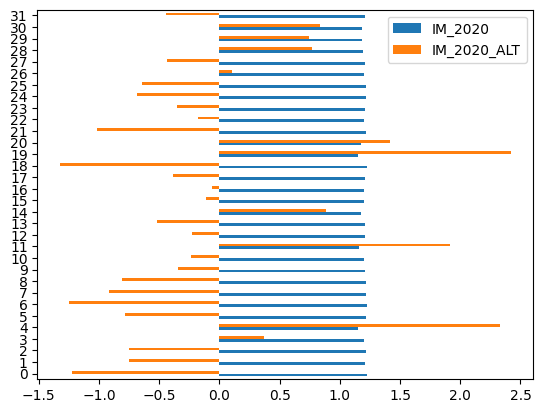

In [47]:
df_IM2020_ALT['IM_2020'] = df_IM2020_ALT['IM_2020']/100
ax = df_IM2020_ALT.plot.barh()
index = df_IM2020_ALT['NOM_ENT'] 

- Estudia las relaciones lineales del IM_2020 con todas las componentes. Hint : Proyecta con la pseudo-inversa a IM_2020 sobre las componentes. Saca la matriz de correlación de IM_2020_ALT con IM_2020.

Lo primero que haremos es calcular la transpuesta de la matriz y multiplicarla por la matriz original y calcular la inversa del resultado.

In [54]:
trans_ori1 = np.matmul(df_FEATURES.transpose(), df_FEATURES)
trans_ori =  np.linalg.inv(trans_ori)
trans_ori = np.matmul(trans_ori, df_FEATURES.transpose())


In [57]:
trans_ori

array([[ 8.43786846e-06, -1.16995289e-06,  1.68434325e-06, ...,
         2.29963136e-07, -9.98634082e-07, -4.53465395e-06],
       [-4.00351972e-06, -1.21375863e-08, -1.83305163e-06, ...,
         3.79541767e-06, -4.27440419e-06,  2.47414670e-06],
       [-8.96582914e-07,  2.07794451e-06,  8.73886348e-07, ...,
        -1.61201061e-06, -1.13944839e-06, -2.25895319e-06],
       ...,
       [ 3.74676121e-06,  1.76829818e-07, -3.41299564e-07, ...,
         1.82673368e-07, -1.57824594e-07, -7.46780168e-07],
       [ 2.73473580e-06, -3.94864143e-07,  1.00025679e-06, ...,
         7.43162022e-07,  3.05940776e-06,  2.75104246e-06],
       [-3.98202141e-06, -1.58329707e-07, -9.54158349e-08, ...,
         5.41736623e-07, -2.70432726e-06, -2.85111290e-06]])

Despues multiplicaremos lo resultante por IM_2020

In [55]:
x = np.matmul(trans_ori, df_INDICE['IM_2020'])

In [56]:
print(np.matmul(df_FEATURES, x))

[114.51853461  50.73261205  48.84726886 ...  89.22494085 117.18917763
  77.66652598]


### Funciones extras usadas:

In [17]:
linear_regression = linear_model.LinearRegression()

def regresion(features, x):
    linear_regression.fit(features, x)
    print('Coeficientes:', linear_regression.coef_)
    print('\nInterceptor:', linear_regression.intercept_)


In [19]:
scaler = StandardScaler()

def transform(x, transformer):
    features_std = transformer.fit_transform(x)
    return features_std

In [ ]:
scaler = StandardScaler()
features_std = scaler.fit_transform(df_FEATURES)